# Clone the repo
Get the repo and submodules

In [ ]:
!git clone https://github.com/amadeomarvell/YOLOv7-Car-Logo-Detection.git

Cloning into 'YOLOv7-Car-Logo-Detection'...
remote: Enumerating objects: 425, done.
remote: Counting objects: 100% (77/77), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 425 (delta 40), reused 22 (delta 7), pack-reused 348
Receiving objects: 100% (425/425), 119.00 MiB | 34.08 MiB/s, done.
Resolving deltas: 100% (199/199), done.


# Clone the repo
Download submodules

In [ ]:
%cd /content/YOLOv7-Car-Logo-Detection/src/yolov7/
!git submodule update --init

/content/YOLOv7-Car-Logo-Detection/src/yolov7
Submodule 'src/yolov7' (https://github.com/WongKinYiu/yolov7.git) registered for path './'
Cloning into '/content/YOLOv7-Car-Logo-Detection/src/yolov7'...
Submodule path './': checked out 'a207844b1ce82d204ab36d87d496728d3d2348e7'


Install the necessary packages.

In [ ]:
!pip install -r /content/YOLOv7-Car-Logo-Detection/src/requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 16.8 MB/s eta 0:00:00


# Download the dataset from google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
from zipfile import ZipFile

In [ ]:
with ZipFile('/content/drive/MyDrive/Car Logo Dataset 27 Contrasted.zip', 'r') as TestZip: TestZip.extractall('/content/YOLOv7-Car-Logo-Detection/Car Logo Dataset 27')

Then, split data into sets.Next, we need to partition the dataset into train, validation, and test sets. These will contain 80%, 10%, and 10% of the data, respectively.

In [ ]:
!python /content/YOLOv7-Car-Logo-Detection/src/prepare_data.py --dataset CarLogos

# Start training

In [ ]:
!python /content/YOLOv7-Car-Logo-Detection/src/yolov7/train.py --img-size 480 --cfg /content/YOLOv7-Car-Logo-Detection/src/cfg/training/yolov7.yaml --hyp /content/YOLOv7-Car-Logo-Detection/data/hyp.scratch.yaml --batch 8 --epoch 100 --data /content/YOLOv7-Car-Logo-Detection/data/data.yaml --weights /content/YOLOv7-Car-Logo-Detection/src/yolov7_training.pt --workers 2 --name yolo_logo_det --device 0

2023-12-17 10:39:59.407522: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-17 10:39:59.407572: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-17 10:39:59.409084: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-17 10:39:59.417064: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-17 10:40:00.529561: W tensorflow/comp

# Detect test images

Install requirements

In [ ]:
!pip3 install -r /content/YOLOv7-Car-Logo-Detection/requirements.txt

Detect license plates from test images

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
test_images_folder = '/content/YOLOv7-Car-Logo-Detection/data/images/test/'
wpodnet_model_path = '/content/YOLOv7-Car-Logo-Detection/wpodnet.pth'
annotated_folder = '/content/YOLOv7-Car-Logo-Detection/data/images/annotated2/'
warped_folder = '/content/YOLOv7-Car-Logo-Detection/data/images/warped2/'
os.makedirs(annotated_folder, exist_ok=True)
os.makedirs(warped_folder, exist_ok=True)
for filename in os.listdir(test_images_folder):
    if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
        input_image_path = os.path.join(test_images_folder, filename)
        command = f'python3 /content/YOLOv7-Car-Logo-Detection/predict.py {input_image_path} -w {wpodnet_model_path} --save-annotated {annotated_folder} --save-warped {warped_folder}'
        os.system(command)
        original_img = mpimg.imread(input_image_path)
        annotated_img_path = os.path.join(annotated_folder, filename)
        warped_img_path = os.path.join(warped_folder, filename)
        annotated_img = mpimg.imread(annotated_img_path)
        warped_img = mpimg.imread(warped_img_path)
    # Show license plates
        plt.subplot(1, 3, 1)
        plt.imshow(original_img)
        plt.title('Original Image')
        plt.subplot(1, 3, 2)
        plt.imshow(annotated_img)
        plt.title('Annotated Image')
        plt.subplot(1, 3, 3)
        plt.imshow(warped_img)
        plt.title('Warped Image')


In [ ]:
import cv2
import os

# Specify the paths to the input (original) and output (enhanced) folders
input_folder = '/content/YOLOv7-Car-Logo-Detection/data/images/test2/'
output_folder = '/content/YOLOv7-Car-Logo-Detection/data/images/enhanced/'

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Function to apply adaptive histogram equalization to an image
def apply_adaptive_equalization(image_path, output_path):
    # Read the image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply adaptive histogram equalization
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img_enhanced = clahe.apply(img)

    # Save the enhanced image
    cv2.imwrite(output_path, img_enhanced)

# Iterate through all files in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Full path to the input and output images
        input_image_path = os.path.join(input_folder, filename)
        output_image_path = os.path.join(output_folder, f'enhanced_{filename}')

        # Apply adaptive histogram equalization
        apply_adaptive_equalization(input_image_path, output_image_path)

# Display or further process the enhanced images as needed


Detect logos from test images

In [ ]:
!python /content/YOLOv7-Car-Logo-Detection/src/yolov7/detect.py --source /content/YOLOv7-Car-Logo-Detection/data/images/annotated2 --weights /content/YOLOv7-Car-Logo-Detection/src/yolov7/runs/train/yolo_logo_det2/weights/best.pt --conf 0.25 --name yolo_logo_det

Namespace(weights=['/content/YOLOv7-Car-Logo-Detection/src/yolov7/runs/train/yolo_logo_det2/weights/best.pt'], source='/content/YOLOv7-Car-Logo-Detection/data/images/annotated', img_size=640, conf_thres=0.25, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='yolo_logo_det', exist_ok=False, no_trace=False)
YOLOR 🚀 v0.1-128-ga207844 torch 2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151.125MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36622016 parameters, 6194

# Show all test images result

In [ ]:
from IPython.display import Image, display
import os
import shutil

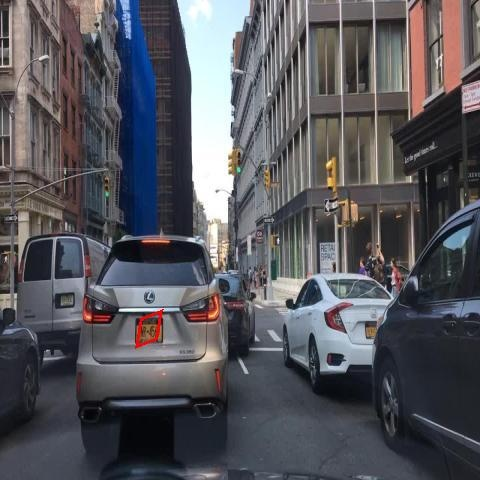

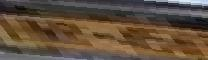

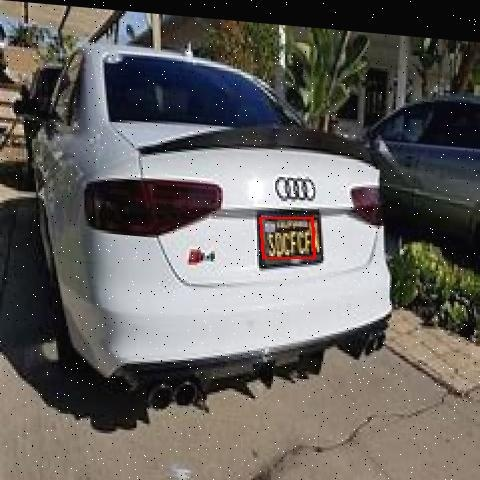

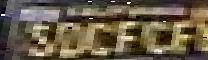

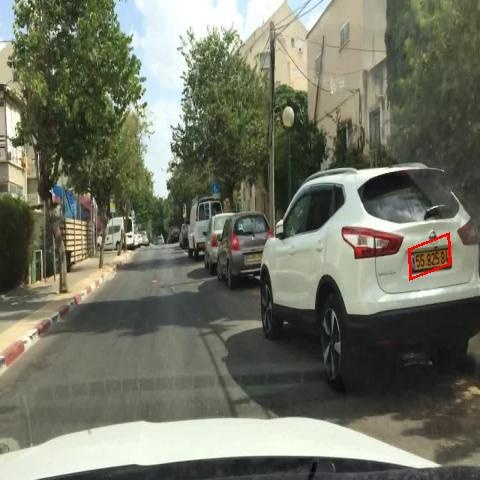

...

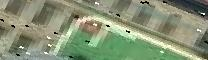

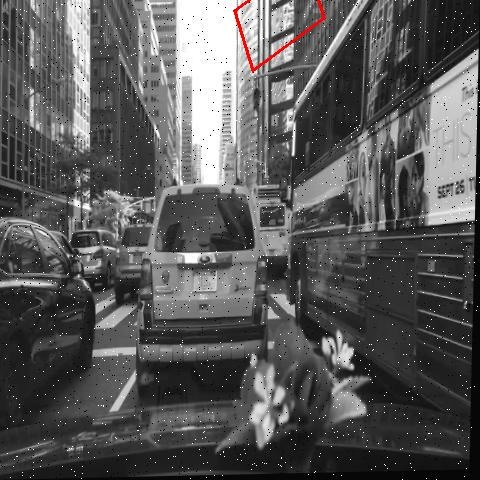

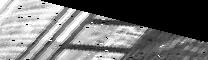

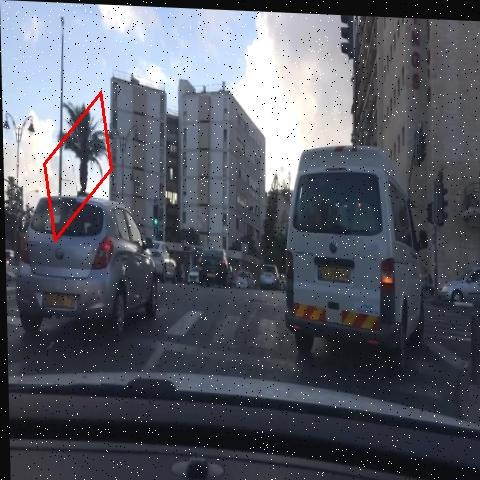

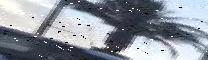

In [ ]:
results_path = '/content/YOLOv7-Car-Logo-Detection/src/yolov7/runs/detect/yolo_logo_det2/'
warped_folder = '/content/YOLOv7-Car-Logo-Detection/data/images/warped2/'
drive_folder = '/content/drive/MyDrive/YOLOv7_Car_Logo_Detection_27_Results_Contrasted'
os.makedirs(drive_folder, exist_ok=True)
for filename in os.listdir(results_path):
    if filename.endswith('.jpg'):
        source_path = os.path.join(results_path, filename)
        destination_path = os.path.join(drive_folder, filename)
        shutil.copyfile(source_path, destination_path)
from IPython.display import Image, display
for filename in os.listdir(results_path):
    if filename.endswith('.jpg'):
        image_path = os.path.join(results_path, filename)
        warped_image_path = os.path.join(warped_folder, filename)
        display(Image(filename=image_path), Image(filename=warped_image_path))